# CitiBike Final Dashboard



# NEED TO MOVE THE SCRIPT TO THE RIGHT FOLDER 

## 01. Libraries/Imports

In [1]:
import streamlit as st
import pandas as pd
import numpy as np
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from datetime import datetime as dt
from streamlit_keplergl import keplergl_static

C:\Users\Chase\anaconda3\envs\CitiBike\Lib\site-packages\keplergl\keplergl.py:2: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_string


In [3]:
# Import merged csv
ny_data_merged_v2 = pd.read_csv(
    "C:/Users/Chase/anaconda_projects/Data Visualizations with Python/Achievement 2/CitiBike/02_Data/Prepared_Data/ny_data_merged_v2.csv"
)

C:\Users\Chase\AppData\Local\Temp\ipykernel_40232\301375301.py:2: DtypeWarning: Columns (5,7) have mixed types. Specify dtype option on import or set low_memory=False.
  ny_data_merged_v2 = pd.read_csv(


In [2]:
# Import merged csv
tripdur_focus = pd.read_csv(
    "C:/Users/Chase/anaconda_projects/Data Visualizations with Python/Achievement 2/CitiBike/02_Data/Prepared_Data/tripduration_focus.csv"
)

## 02. Data Inspection

### Main

In [6]:
ny_data_merged_v2.shape

(29838166, 19)

In [7]:
ny_data_merged_v2.head()

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual,date,avgTemp,_merge,bike_rides_daily,value,tripduration
0,4A091640AEC83471,classic_bike,2022-01-01 16:01:22.082,2022-01-01 16:05:11.986,S 4 St & Wythe Ave,5204.05,Kent Ave & S 11 St,5062.01,40.712859,-73.965903,40.707645,-73.968415,member,2022-01-01,11.6,both,20428,1,3.831733
1,7A560D6287C00126,classic_bike,2022-01-01 14:07:04.344,2022-01-01 14:31:57.500,Lexington Ave & E 120 St,7652.04,Amsterdam Ave & W 125 St,7800.03,40.801307,-73.939817,40.813358,-73.956461,member,2022-01-01,11.6,both,20428,1,24.885933
2,4F6F726B809C15E4,classic_bike,2022-01-01 12:02:26.943,2022-01-01 12:14:13.555,Lexington Ave & E 120 St,7652.04,Amsterdam Ave & W 125 St,7800.03,40.801307,-73.939817,40.813358,-73.956461,member,2022-01-01,11.6,both,20428,1,11.776867
3,3BC10DC94FD79955,classic_bike,2022-01-01 22:53:23.508,2022-01-01 23:18:42.881,Cleveland Pl & Spring St,5492.05,Mott St & Prince St,5561.04,40.722104,-73.997249,40.723180,-73.994800,member,2022-01-01,11.6,both,20428,1,25.322883
4,FE4CE7F1CFFD7952,classic_bike,2022-01-01 08:04:51.755,2022-01-01 08:08:07.290,Central Park North & Adam Clayton Powell Blvd,7617.07,E 110 St & Madison Ave,7587.14,40.799484,-73.955613,40.796154,-73.947821,member,2022-01-01,11.6,both,20428,1,3.258917


In [8]:
ny_data_merged_v2.columns

Index(['ride_id', 'rideable_type', 'started_at', 'ended_at',
       'start_station_name', 'start_station_id', 'end_station_name',
       'end_station_id', 'start_lat', 'start_lng', 'end_lat', 'end_lng',
       'member_casual', 'date', 'avgTemp', '_merge', 'bike_rides_daily',
       'value', 'tripduration'],
      dtype='object')

### Secondary

In [9]:
tripdur_focus.shape

(29371361, 3)

In [10]:
tripdur_focus.head()

,member_casual,tripduration,date
0,member,3.831733,2022-01-01
1,member,24.885933,2022-01-01
2,member,11.776867,2022-01-01
3,member,25.322883,2022-01-01
4,member,3.258917,2022-01-01


In [11]:
tripdur_focus.dtypes

member_casual     object
tripduration     float64
date              object
dtype: object

In [12]:
tripdur_focus.columns

Index(['member_casual', 'tripduration', 'date'], dtype='object')

### Change date to Datetime

In [3]:
# Change the 'date' column to date-time
tripdur_focus['date'] = pd.to_datetime(tripdur_focus['date'], errors='coerce')

In [4]:
# Work check
tripdur_focus['date'].dtype

dtype('<M8[ns]')

In [5]:
# Double check the dates to ensure no year anomailes
tripdur_focus['date'].dt.year.unique()

array([2022], dtype=int32)

## 03. Trip Duration Box Plot -> Plotly

In [10]:
sample = tripdur_focus.sample(n=500000)

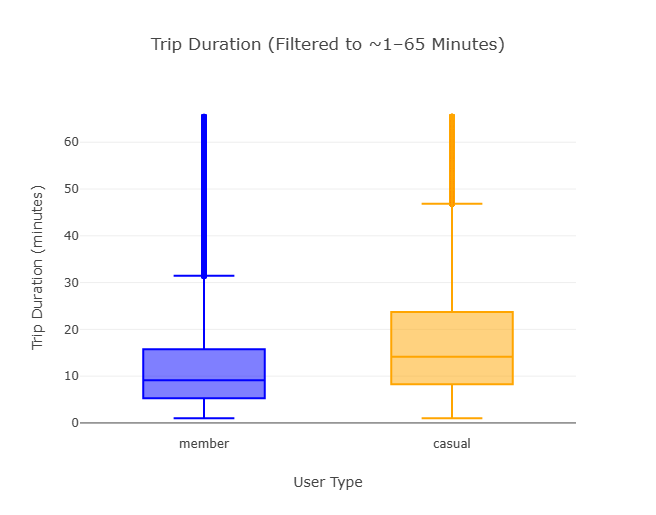

In [14]:
# Box plot 

fig = px.box(
    sample,
    x="member_casual",
    y="tripduration",
    color="member_casual",
    points="outliers",
    color_discrete_sequence=["blue", "orange"],
    title="Trip Duration (Filtered to ~1–65 Minutes)"
)

fig.update_layout(
    xaxis_title="User Type",
    yaxis_title="Trip Duration (minutes)",
    showlegend=False,
    height=500,
    width=900
)

fig.show(config={'staticPlot': True})

In [8]:
tripdur_focus.describe()

,tripduration,date
count,2.937136e+07,29371361
mean,1.330825e+01,2022-07-17 19:05:14.186507520
min,1.000233e+00,2022-01-01 00:00:00
25%,5.737383e+00,2022-05-14 00:00:00
50%,9.997167e+00,2022-07-23 00:00:00
75%,1.744687e+01,2022-09-26 00:00:00
max,6.544997e+01,2022-12-31 00:00:00
std,1.077623e+01,NaN


## 04. Random Selection of Data
#### Take a random selection from the main dataset to push into GitHub